**Import libraries and load pointcloud and calibration data**

In [101]:
data_folder = '/home/mfi/repos/rtc_vision_toolbox/data/calibration_data/no_object/'

In [102]:
import numpy as np
import glob
import re
import open3d as o3d
import plotly.graph_objs as go
from plotly.subplots import make_subplots

pcd_files = glob.glob(data_folder+'*.npz')

cameras = {}
for filepath in pcd_files:
    filename = filepath.split('/')[-1]
    match = re.match(r"([a-zA-Z0-9]+)[_|-](.+).npz", filename)
    camera = match.group(1)
    if camera not in cameras.keys():
        cameras[camera] = {
            'pcds': {}
        }
    
    pcd = np.load(filepath)['arr_0']
    cameras[camera]['pcds'][match.group(2)] = pcd
    
transform_files = glob.glob(f'/home/mfi/repos/rtc_vision_toolbox/data/calibration_data/T_*.npy')
transforms = []
for filepath in transform_files:
    print(f'filename: {filepath.split("/")[-1]}')
    transform = np.load(filepath, allow_pickle=True)
    transforms.append(transform)

BASE2CAM_TF = {
    'CL8FC3100RL': transforms[2], # this is T_base2cam0.npy
    'CL8FC3100W3': transforms[1], # this is T_base2cam1.npy
    'CL8FC3100NM': transforms[0], # this is T_base2cam2.npy
}

PCD = {
    'CL8FC3100RL': cameras['CL8FC3100RL']['pcds']['no_object']/1000,
    'CL8FC3100W3': cameras['CL8FC3100W3']['pcds']['no_object']/1000,
    'CL8FC3100NM': cameras['CL8FC3100NM']['pcds']['no_object']/1000,
}

T_orig = [np.array(BASE2CAM_TF['CL8FC3100RL'])]
T_orig.append(np.array(BASE2CAM_TF['CL8FC3100W3']))
T_orig.append(np.array(BASE2CAM_TF['CL8FC3100NM']))

pcd_orig = [np.array(PCD['CL8FC3100RL'])]
pcd_orig.append(np.array(PCD['CL8FC3100W3']))
pcd_orig.append(np.array(PCD['CL8FC3100NM']))

filename: T_base2cam2.npy
filename: T_base2cam1.npy
filename: T_base2cam0.npy


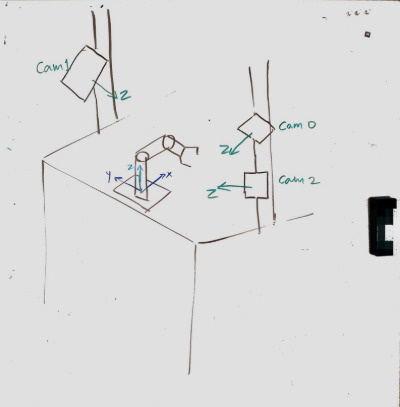

**Print TF matrices**

In [103]:
for key,value in BASE2CAM_TF.items():
    print(f'{key}:\n{value}')

CL8FC3100RL:
[[ 0.01614347  0.99983443 -0.00839604  0.22871145]
 [ 0.84315664 -0.00909934  0.53759101 -0.54673568]
 [ 0.5374256  -0.01575776 -0.84316393  0.64873757]
 [ 0.          0.          0.          1.        ]]
CL8FC3100W3:
[[ 0.02548761  0.9996682  -0.00372424  0.24031213]
 [ 0.43042013 -0.01433631 -0.90251481  0.5739147 ]
 [-0.90226875  0.02139996 -0.43064272  0.56335116]
 [ 0.          0.          0.          1.        ]]
CL8FC3100NM:
[[ 7.24217583e-03  9.99869362e-01  1.44502453e-02  2.21182673e-01]
 [ 8.42869726e-05 -1.44512346e-02  9.99895572e-01 -5.58007190e-01]
 [ 9.99973772e-01 -7.24020157e-03 -1.88934343e-04  4.14548984e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


---
### PCD
**Transform the PCD points using original tf matrices**

In [108]:
pcds_tf = []
for camera, pcd in PCD.items():
    o3d_pcd = o3d.geometry.PointCloud()
    o3d_pcd.points = o3d.utility.Vector3dVector(pcd)
    
    o3d_pcd = o3d_pcd.uniform_down_sample(100)
    np_pcd = np.asarray(o3d_pcd.points)        
    np_pcd_h = np.hstack((np_pcd, np.ones((np_pcd.shape[0], 1))))
    
    np_pcd_tf = np.matmul(BASE2CAM_TF[camera], np_pcd_h.T).T[:, :3]
    print(camera)
    pcds_tf.append(np_pcd_tf)
        
print('Transformations Done!')

CL8FC3100RL
CL8FC3100W3
CL8FC3100NM
Transformations Done!


**Visualize PCDs**

In [109]:
import numpy as np
import plotly.graph_objs as go

def plot_multi_np(plist):
    """
    Args: plist, list of numpy arrays of shape, (1,num_points,3)
    """
    colors = [
        '#1f77b4',  # muted blue
        '#ff7f0e',  # safety orange
        '#2ca02c',  # cooked asparagus green
        '#d62728',  # brick red
        '#9467bd',  # muted purple
        '#e377c2',  # raspberry yogurt pink
        '#8c564b',  # chestnut brown
        '#7f7f7f',  # middle gray
        '#bcbd22',  # curry yellow-green
        '#17becf',  # blue-teal
        '#1f77b4',  # muted blue
        '#ff7f0e',  # safety orange
        '#2ca02c',  # cooked asparagus green
        '#d62728',  # brick red
        '#9467bd',  # muted purple
        '#e377c2',  # raspberry yogurt pink
        '#8c564b',  # chestnut brown
        '#7f7f7f',  # middle gray
        '#bcbd22',  # curry yellow-green
        '#17becf',  # blue-teal
        '#1f77b4',  # muted blue
        '#ff7f0e',  # safety orange
        '#2ca02c',  # cooked asparagus green
        '#d62728',  # brick red
        '#9467bd',  # muted purple
        '#e377c2',  # raspberry yogurt pink
        '#8c564b',  # chestnut brown
        '#7f7f7f',  # middle gray
        '#bcbd22',  # curry yellow-green
        '#17becf',  # blue-teal
    ]
    skip = 1
    go_data = []
    for i in range(len(plist)):
        p_dp = plist[i]
        plot = go.Scatter3d(x=p_dp[::skip,0], y=p_dp[::skip,1], z=p_dp[::skip,2], 
                     mode='markers', marker=dict(size=2, color=colors[i],
                     symbol='circle'))
        go_data.append(plot)
 
    layout = go.Layout(
        scene=dict(
            aspectmode='data',
        ),
        height=1200,
        width=900,
    )
    
    colors = ['red', 'green', 'blue']  # X, Y, Z axis colors
    
    fig = go.Figure()

    T = T_orig.copy()
    T_init = np.eye(4)
    T.append(T_init)
    
    for tf in T:
        origin = tf[:3, 3]
        axes = tf[:3, :3]

        for i in range(3):
            axis_end = origin + 0.2*axes[:, i]
            fig.add_trace(go.Scatter3d(
                x=[origin[0], axis_end[0]],
                y=[origin[1], axis_end[1]],
                z=[origin[2], axis_end[2]],
                mode='lines',
                line=dict(color=colors[i], width=4),
                name='Axis ' + str(i+1)
            ))

    for plot in go_data:
        fig.add_trace(plot)

    # add axis lines and camera view
    fig.update_layout(scene=dict(
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z'),
        camera = dict(
                      eye=dict(x=-1.0, y=0, z=-.25),
                      center=dict(x=0., y=0, z=-0.25),
                      up=dict(x=0, y=0, z=1),
                     )
        ),
        height=800,
        width=1200,
    )
                      
    fig.show()

print("plot_multi_np defined!")

plot_multi_np defined!


In [110]:
plot_multi_np(pcds_tf)

---
### PCD Registration

**convert PCDs to o3d objects**

In [111]:
target_cam_id = 0
all_cam_ids = ['CL8FC3100RL', 'CL8FC3100W3', 'CL8FC3100NM']

o3d_pcd_list = []
for i in range(len(pcds_tf)):
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(pcds_tf[i])
    print(f"pcd {i} has {len(pcds_tf[i])} points")
    o3d_pcd_list.append(pcd)

pcd 0 has 8260 points
pcd 1 has 6657 points
pcd 2 has 5324 points


In [147]:
def preprocess_point_cloud(pcd_down, voxel_size):
    
    print("\nsize of original point cloud is %d" % len(pcd_down.points))
    
    print(":: Downsample with a voxel size %.3f." % voxel_size)
    pcd_down = pcd_down.voxel_down_sample(voxel_size)

    print("size of downsampled point cloud is %d" % len(pcd_down.points))

    overlap_y = [-0.6, 0.6]
    overlap_x = [0.1, 0.50]
    print(":: Removing points outside overlap zone.")
    y_coordinates = np.array(pcd_down.points)[:, 1]
    x_coordinates = np.array(pcd_down.points)[:, 0]
    
    # Filter points within the specified y-axis limits
    mask = (y_coordinates >= overlap_y[0]) & (y_coordinates <= overlap_y[1]) & (x_coordinates >= overlap_x[0]) & (x_coordinates <= overlap_x[1])
    pcd_down = pcd_down.select_by_index(np.where(mask)[0])
    
    print("size of masked point cloud is %d" % len(pcd_down.points))

    pcd_down, _ = pcd_down.remove_statistical_outlier(nb_neighbors=10, std_ratio=1.0)    
    radius = 0.03
    pcd_down, _ = pcd_down.remove_radius_outlier(nb_points= 10, radius=radius)
    # pcd_down, _ = pcd_down.remove_radius_outlier(nb_points= int(((radius / voxel_size) ** 2) * 0.95) , radius=radius)

    radius_normal = voxel_size * 20
    print(":: Estimate normal with search radius %.3f." % radius_normal)
    pcd_down.estimate_normals(
        o3d.geometry.KDTreeSearchParamHybrid(radius=radius_normal, max_nn=30))

    print("size of processed point cloud is %d" % len(pcd_down.points))

    # radius_feature = voxel_size * 5
    # print(":: Compute FPFH feature with search radius %.3f." % radius_feature)
    # pcd_fpfh = o3d.pipelines.registration.compute_fpfh_feature(
    #     pcd_down,
    #     o3d.geometry.KDTreeSearchParamHybrid(radius=radius_feature, max_nn=100))
    return pcd_down

# Preprocess Point Clouds
pcd_down_list = []
pcd_fpfh_list = []
for pcd_down in o3d_pcd_list:
    # pcd_down, pcd_fpfh = preprocess_point_cloud(pcd_down, voxel_size=0.005)
    pcd_down= preprocess_point_cloud(pcd_down, voxel_size=0.002)
    pcd_down_list.append(pcd_down)
    #pcd_fpfh_list.append(pcd_fpfh)


size of original point cloud is 8260
:: Downsample with a voxel size 0.002.
size of downsampled point cloud is 8151
:: Removing points outside overlap zone.
size of masked point cloud is 5194
:: Estimate normal with search radius 0.040.
size of processed point cloud is 4309

size of original point cloud is 6657
:: Downsample with a voxel size 0.002.
size of downsampled point cloud is 6518
:: Removing points outside overlap zone.
size of masked point cloud is 3835
:: Estimate normal with search radius 0.040.
size of processed point cloud is 3306

size of original point cloud is 5324
:: Downsample with a voxel size 0.002.
size of downsampled point cloud is 5077
:: Removing points outside overlap zone.
size of masked point cloud is 2410
:: Estimate normal with search radius 0.040.
size of processed point cloud is 2004


In [152]:
#visualize
np_pcd_points = []

for each in pcd_down_list:
    np_pcd = np.asarray(each.points)
    print(np_pcd.shape)
    np_pcd_points.append(np_pcd)
    
plot_multi_np([np_pcd_points[0], np_pcd_points[1]])


(4309, 3)
(3306, 3)
(2004, 3)


In [149]:
def get_registration(source, target, voxel_size):
    distance_threshold = voxel_size * 0.3
    sigma = 0.02
    # print(":: Point-to-plane ICP registration is applied on original point")
    # print("   clouds to refine the alignment. This time we use a strict")
    # print("   distance threshold %.3f." % distance_threshold)
    print("Robust point-to-plane ICP, threshold={}:".format(distance_threshold))
    loss = o3d.pipelines.registration.TukeyLoss(k=sigma)
    print("Using robust loss:", loss)
    #p2l = o3d.pipelines.registration.TransformationEstimationPointToPlane(loss)
    p2l = o3d.pipelines.registration.TransformationEstimationPointToPlane()
    result = o3d.pipelines.registration.registration_icp(
        source, target, distance_threshold, 
        np.eye(4), p2l)
    return result

target_pcd_down = pcd_down_list[target_cam_id]
result_icp_list = []
for i in range(len(pcd_down_list)):
    result_icp = get_registration(pcd_down_list[i], target_pcd_down, voxel_size = 0.04)
    result_icp_list.append(result_icp)
    print(result_icp)

Robust point-to-plane ICP, threshold=0.012:
Using robust loss: RobustKernel::TukeyLoss with k=0.020000
RegistrationResult with fitness=1.000000e+00, inlier_rmse=0.000000e+00, and correspondence_set size of 4309
Access transformation to get result.
Robust point-to-plane ICP, threshold=0.012:
Using robust loss: RobustKernel::TukeyLoss with k=0.020000
RegistrationResult with fitness=2.622505e-01, inlier_rmse=7.198048e-03, and correspondence_set size of 867
Access transformation to get result.
Robust point-to-plane ICP, threshold=0.012:
Using robust loss: RobustKernel::TukeyLoss with k=0.020000
RegistrationResult with fitness=8.812375e-01, inlier_rmse=5.913610e-03, and correspondence_set size of 1766
Access transformation to get result.


**Visualize Registration Results**

In [150]:
for i in range(3):
    print(f"Transformation matrix from camera {all_cam_ids[i]} to camera {all_cam_ids[target_cam_id]}")
    print(result_icp_list[i].transformation.round(2))

Transformation matrix from camera CL8FC3100RL to camera CL8FC3100RL
[[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]]
Transformation matrix from camera CL8FC3100W3 to camera CL8FC3100RL
[[ 1.   -0.09 -0.01  0.  ]
 [ 0.09  0.99 -0.06 -0.02]
 [ 0.01  0.05  1.   -0.01]
 [ 0.    0.    0.    1.  ]]
Transformation matrix from camera CL8FC3100NM to camera CL8FC3100RL
[[ 1.   -0.03 -0.   -0.01]
 [ 0.03  1.   -0.01 -0.01]
 [ 0.    0.01  1.   -0.01]
 [ 0.    0.    0.    1.  ]]


In [153]:
# BEFORE
plot_multi_np(pcds_tf)

# AFTER
T_new = []
for i in range(3):
    T_target2cam = np.dot(np.linalg.inv(T_orig[target_cam_id]), T_orig[i])
    #T_target2cam = np.dot(ransac_tfs[i], T_target2cam)
    T_target2cam = np.dot(T_target2cam, result_icp_list[i].transformation)
    T_base2cam = np.dot(T_orig[target_cam_id], T_target2cam)
    T_new.append(T_base2cam)

BASE2CAM_TF_NEW = {}
for key in BASE2CAM_TF.keys():
    BASE2CAM_TF_NEW[key] = T_new[all_cam_ids.index(key)]
    
new_pcd_tf = []
for camera, pcd in PCD.items():
    o3d_pcd = o3d.geometry.PointCloud()
    o3d_pcd.points = o3d.utility.Vector3dVector(pcd)
    
    o3d_pcd = o3d_pcd.uniform_down_sample(100)
    np_pcd = np.asarray(o3d_pcd.points)        
    np_pcd_h = np.hstack((np_pcd, np.ones((np_pcd.shape[0], 1))))
    
    np_pcd_tf = np.matmul(BASE2CAM_TF_NEW[camera], np_pcd_h.T).T[:, :3]

    new_pcd_tf.append(np_pcd_tf)
        
print('Transformations Done!')    

plot_multi_np(new_pcd_tf)

Transformations Done!


**Before and after reprojection error**

In [119]:
from calibration.calibrations import *
import os

T_eef2marker = np.array([
                [-1.0, 0.0, 0.0, 0.1016], 
                [0.0, -1.0, 0.0, 0.0], 
                [0.0, 0.0, 1.0, 0.049], 
                [0.0, 0.0, 0.0, 1.0]])

cam_id = ['cam0', 'cam1', 'cam2']

for i in range(len(cam_id)):
    print(f"\nCamera {cam_id[i]}")
    dir_path = '/home/mfi/repos/rtc_vision_toolbox/data/'
    data_dir = os.path.join(dir_path, f'calibration_data/{cam_id[i]}/04-16')

    T_camera2marker_set = np.load(os.path.join(data_dir, 'T_camera2marker_set.npy'))

    T_base2eef_set = np.load(os.path.join(data_dir, 'T_base2eef_set.npy'))
    T_base2marker_set = [np.dot(T_base2eef, T_eef2marker) for T_base2eef in T_base2eef_set]

    print("BEFORE:")
    T_base2camera = T_orig[i]
    avg_error, std_error = calculate_reprojection_error(T_base2marker_set, T_camera2marker_set, T_base2camera)
    #print(f"Transformation matrix T_base2camera:\n{T_base2camera}")
    print(f"Avg. reprojection error:: {avg_error}, std. error: {std_error}")

    print("AFTER:")
    T_base2camera = T_new[i]
    avg_error, std_error = calculate_reprojection_error(T_base2marker_set, T_camera2marker_set, T_base2camera)
    #print(f"Transformation matrix T_base2camera:\n{T_base2camera}")
    print(f"Avg. reprojection error:: {avg_error}, std. error: {std_error}")


Camera cam0
BEFORE:
Avg. reprojection error:: 0.004523284819058573, std. error: 0.0030145648466235863
AFTER:
Avg. reprojection error:: 0.004523284819058566, std. error: 0.003014564846623598

Camera cam1
BEFORE:
Avg. reprojection error:: 0.012398047036536046, std. error: 0.050767450523580594
AFTER:
Avg. reprojection error:: 0.018865328445487873, std. error: 0.05131863353547864

Camera cam2
BEFORE:
Avg. reprojection error:: 0.003148978299098065, std. error: 0.0016447716601836917
AFTER:
Avg. reprojection error:: 0.007726862442022623, std. error: 0.0023740611847525494
